In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

file_path = ['../dataset/2021-plu-total-hab-data.csv',
              '../dataset/2022-plu-total-hab-data.csv',
              '../dataset/2023-plu-total-hab-data.csv',
              '../dataset/2024-plu-total-hab-data.csv']

merged_df = pd.concat([pd.read_csv(file) for file in file_path])

merged_df.to_csv('../dataset/merged_df.csv', index=False)

**Informe de Calidad de los Datos**: Un informe detallado sobre la calidad de los datos, incluyendo los problemas identificados y las acciones tomadas para mejorarlos (tratamiento de valores faltantes, inconsistencias, etc.).

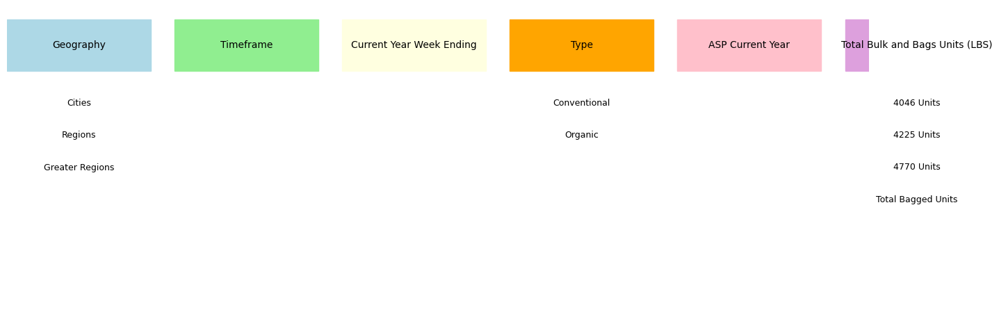

In [2]:
# Create a figure for the diagram
fig, ax = plt.subplots(figsize=(16, 6))
ax.set_xlim(0, 18)
ax.set_ylim(0, 5)


# Draw the main categories
ax.add_patch(mpatches.Rectangle((0, 4), 3, 0.8, color="lightblue"))
ax.text(1.5, 4.4, "Geography", ha="center", va="center", fontsize=10)


# Add smaller boxes for subcategories of geography in vertical layout
x_center = 1.5
y_positions = [3, 2.5, 2]
subcategories = ["Cities", "Regions", "Greater Regions"]
for i, (y, label) in enumerate(zip(y_positions, subcategories)):
    ax.text(x_center, y + 0.5, label, ha="center", va="center", fontsize=9)


ax.add_patch(mpatches.Rectangle((3.5, 4), 3, 0.8, color="lightgreen"))
ax.text(5, 4.4, "Timeframe", ha="center", va="center", fontsize=10)


ax.add_patch(mpatches.Rectangle((7, 4), 3, 0.8, color="lightyellow"))
ax.text(8.5, 4.4, "Current Year Week Ending", ha="center", va="center", fontsize=10)


ax.add_patch(mpatches.Rectangle((10.5, 4), 3, 0.8, color="orange"))
ax.text(12, 4.4, "Type", ha="center", va="center", fontsize=10)

# Add subcategories for Type in vertical layout
ax.add_patch(mpatches.Rectangle((2, 7), 6, 0.6, color="lightcoral"))
ax.text(12, 3.5, "Conventional", ha="center", va="center", fontsize=9)
ax.add_patch(mpatches.Rectangle((2, 6.2), 6, 0.6, color="lightcoral"))
ax.text(12, 3, "Organic", ha="center", va="center", fontsize=9)


ax.add_patch(mpatches.Rectangle((14, 4), 3, 0.8, color="pink"))
ax.text(15.5, 4.4, "ASP Current Year", ha="center", va="center", fontsize=10)


# Add the Total Bulk and Bags Units category
ax.add_patch(mpatches.Rectangle((17.5, 4), 3, 0.8, color="plum"))
ax.text(19, 4.4, "Total Bulk and Bags Units (LBS)", ha="center", va="center", fontsize=10)

# Add smaller boxes for subcategories of Total Bulk and Bags Units in vertical layout
x_center = 19
y_positions = [3, 2.5, 2, 1.5]
subcategories = ["4046 Units", "4225 Units", "4770 Units", "Total Bagged Units"]
for i, (y, label) in enumerate(zip(y_positions, subcategories)):
    ax.text(x_center, y + 0.5, label, ha="center", va="center", fontsize=9)


# Remove axis for a cleaner look
ax.axis('off')

# Show the diagram
plt.show()

- Análisis de Calidad de los Datos: Evaluar la calidad de los datos, identificando problemas como valores faltantes, inconsistencias, errores o duplicados. (Hacer un mapa de calor de los datos y consultar en HASS si los valores faltantes se explican)


In [3]:
import pandas as pd

merged_df = pd.read_csv('../dataset/merged_df.csv')
suppliers_df = pd.read_csv('../dataset/merged_suppliers.csv')

In [4]:
import matplotlib.pyplot as plt
import plotly.express as px

plt.figure(figsize=(10, 8))
fig1 = px.imshow(merged_df.isnull(),
    color_continuous_scale=['black','red'],
    labels=dict(color="NaN"),
    title="Valores perdidos para avocado")
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()

fig1.write_image("../imagenes/valores_perdidos_iniciales_para_avocado.png", scale=2)

<Figure size 1000x800 with 0 Axes>

Se observa que la base de datos merged_df contiene registros hasta la semana 1 de noviembre de 2024. Para completar los datos faltantes del año, se llevaron a cabo los siguientes pasos:
1.	Se filtró el cuarto trimestre de los años 2021, 2022 y 2023 de la base de datos.
2.	Se calculó el promedio mensual de las columnas “ASP Current Year”, “Total Bulk and Bags Units”, “4046 Units”, “4225 Units”, “4770 Units” y “Total Bagged Units”, teniendo en cuenta la geografía y el tipo de aguacate.
3.	Se creó una nueva base de datos llamada proyeccion_df, que contiene la proyección de los datos correspondientes a las 3 semanas restantes de noviembre y las 5 semanas de diciembre de 2024, utilizando los resultados del cálculo anterior. El número de registros nuevos es 944, que corresponden a 8 semanas por cada tipo de aguacate, 16 por cada geografía (16*59 = 944)
4.	Finalmente, se combinó la base de datos merged_df con proyeccion_df.

In [5]:
# Convert the 'Current Year Week Ending' column to datetime if not already done
merged_df['Current Year Week Ending'] = pd.to_datetime(merged_df['Current Year Week Ending'], errors='coerce')

# Filter the records for October, November, and December of 2021, 2022, 2023, and 2024
oct_nov_dec_records = merged_df[
    ((merged_df['Current Year Week Ending'].dt.month >= 10) & 
     (merged_df['Current Year Week Ending'].dt.month <= 12)) & 
    (merged_df['Current Year Week Ending'].dt.year.isin([2021, 2022, 2023, 2024]))
]

# Calculate the mean for the specified columns by month, grouped by geography and type of avocado
monthly_mean = oct_nov_dec_records.groupby([
    oct_nov_dec_records['Current Year Week Ending'].dt.to_period('M'), 
    'Geography', 
    'Type'
])[['ASP Current Year', 'Total Bulk and Bags Units', '4046 Units', '4225 Units', '4770 Units', 'TotalBagged Units']].mean().reset_index()

# Define the new Current Year Week Ending dates
new_dates = pd.to_datetime([
    '2024-11-10 00:00:00', '2024-11-17 00:00:00', '2024-11-24 00:00:00',
    '2024-12-01 00:00:00', '2024-12-08 00:00:00', '2024-12-15 00:00:00',
    '2024-12-22 00:00:00', '2024-12-29 00:00:00'
])

# Filter the monthly_mean DataFrame for records from 2024-11
filtered_monthly_mean = monthly_mean[monthly_mean['Current Year Week Ending'].dt.to_timestamp() >= '2024-11']

# Create an empty list to store the new records
new_records = []

# Iterate over each row in filtered_monthly_mean
for _, row in filtered_monthly_mean.iterrows():
    for date in new_dates:
        new_record = {
            'Geography': row['Geography'],
            'Timeframe': 'Weekly',
            'Current Year Week Ending': date,
            'Type': row['Type'],
            'ASP Current Year': row['ASP Current Year'],
            'Total Bulk and Bags Units': row['Total Bulk and Bags Units'],
            '4046 Units': row['4046 Units'],
            '4225 Units': row['4225 Units'],
            '4770 Units': row['4770 Units'],
            'TotalBagged Units': row['TotalBagged Units']
        }
        new_records.append(new_record)

# Create a DataFrame from the new records
proyeccion_df = pd.DataFrame(new_records)
proyeccion_df.to_csv('../dataset/proyeccion_df.csv', index=False)

# Merge merged_df and proyeccion_df
avocado_df = pd.concat([merged_df, proyeccion_df], ignore_index=True)

avocado_df.to_csv('../dataset/avocado_df.csv', index=False)

plt.figure(figsize=(10, 8))
fig1 = px.imshow(avocado_df.isnull(),
    color_continuous_scale=['black','red'],
    labels=dict(color="NaN"),
    title="Valores perdidos para avocado")
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()

fig1.write_image("../imagenes/valores_perdidos_finales_para_avocado.png", scale=2)

/var/folders/7z/00rgwf311yn2q_dbm8dwq25m0000gn/T/ipykernel_15652/911683785.py:2: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



<Figure size 1000x800 with 0 Axes>

In [6]:
avocado_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24536 entries, 0 to 24535
Data columns (total 13 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   Geography                  24536 non-null  object        
 1   Timeframe                  24536 non-null  object        
 2   Current Year Week Ending   24536 non-null  datetime64[ns]
 3   Type                       24536 non-null  object        
 4   ASP Current Year           24536 non-null  float64       
 5   Total Bulk and Bags Units  24536 non-null  float64       
 6   4046 Units                 24536 non-null  float64       
 7   4225 Units                 24536 non-null  float64       
 8   4770 Units                 24536 non-null  float64       
 9   TotalBagged Units          24536 non-null  float64       
 10  SmlBagged Units            0 non-null      float64       
 11  LrgBagged Units            0 non-null      float64       
 12  X-Lr

In [7]:
plt.figure(figsize=(10, 8))
fig1 = px.imshow(suppliers_df.isnull(),
    color_continuous_scale=['black','red'],
    labels=dict(color="NaN"),
    title="Valores perdidos para suppliers")
fig1.update_layout(width=700, height=700)
fig1.update_coloraxes(showscale=False)
fig1.show()

fig1.write_image("../imagenes/valores_perdidos_iniciales_para_suppliers.png", scale=2)

<Figure size 1000x800 with 0 Axes>

Reglas para mezclar la base de datos california_df y merged_suppliers:
Se agrupo por "Current Year Week Ending".
- "Geography" y "Timeframe" tienen el mismo valor.
- "Type": Organic and Conventional
- "ASP Current Year": media
- "Total Bulk and Bags Units": suma
- "4046 Units": suma
- "4225 Units": suma
- "4770 Units": suma
- "TotalBagged Units": suma
- "Elasticity": media

In [8]:
california_df = pd.read_csv('../dataset/california_df.csv')

# Convert the 'Current Year Week Ending' column to datetime
california_df['Current Year Week Ending'] = pd.to_datetime(california_df['Current Year Week Ending'], errors='coerce')

# Convert the 'Week Ending' column to datetime
suppliers_df['Week Ending'] = pd.to_datetime(suppliers_df['Week Ending'], errors='coerce')

# Exclude the year 2025 from the suppliers_df
suppliers_df = suppliers_df[suppliers_df['Year'] != 2025]

california_df = california_df[california_df['Current Year Week Ending'].dt.year != 2021]

california_df = california_df.groupby('Current Year Week Ending').agg({
    'Geography': 'first',
    'Timeframe': 'first',
    'Type': lambda x: 'Organic and Conventional',
    'ASP Current Year': 'mean',
    'Total Bulk and Bags Units': 'sum',
    '4046 Units': 'sum',
    '4225 Units': 'sum',
    '4770 Units': 'sum',
    'TotalBagged Units': 'sum',
    'Elasticity': 'mean'
}).reset_index()


#{Timestamp('2024-01-07 00:00:00'), Timestamp('2022-01-09 00:00:00'), Timestamp('2023-01-08 00:00:00')}

suppliers_df['Week Ending'] = suppliers_df['Week Ending'].replace({
    pd.Timestamp('2022-01-09 00:00:00'): pd.Timestamp('2022-01-10 00:00:00'),
    pd.Timestamp('2023-01-08 00:00:00'): pd.Timestamp('2023-01-09 00:00:00'),
    pd.Timestamp('2024-01-07 00:00:00'): pd.Timestamp('2024-01-08 00:00:00')
})

# Merge california_df with suppliers_df to get the 'California' column from suppliers_df
california_df = california_df.merge(suppliers_df[['Week Ending', 'California']], 
                                    left_on='Current Year Week Ending', 
                                    right_on='Week Ending', 
                                    how='left')


# Rename the 'California' column from suppliers_df to 'California Supplier'
california_df.rename(columns={'California': 'California Supplier'}, inplace=True)

# Eliminate the records that do not have a value in the column "California Supplier"
california_df = california_df.dropna(subset=['California Supplier'])

# Drop the 'Week Ending' column as it is no longer needed
california_df.drop(columns=['Week Ending'], inplace=True)

california_df.to_csv('../dataset/california_project_df.csv', index=False)
california_project_df = pd.read_csv('../dataset/california_project_df.csv')

california_project_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156 entries, 0 to 155
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Current Year Week Ending   156 non-null    object 
 1   Geography                  156 non-null    object 
 2   Timeframe                  156 non-null    object 
 3   Type                       156 non-null    object 
 4   ASP Current Year           156 non-null    float64
 5   Total Bulk and Bags Units  156 non-null    float64
 6   4046 Units                 156 non-null    float64
 7   4225 Units                 156 non-null    float64
 8   4770 Units                 156 non-null    float64
 9   TotalBagged Units          156 non-null    float64
 10  Elasticity                 148 non-null    float64
 11  California Supplier        156 non-null    object 
dtypes: float64(7), object(5)
memory usage: 14.8+ KB


In [16]:
california_project_df['Unidades pequeñas'] = california_project_df['4046 Units'] / 0.19
california_project_df['Unidades medianas'] = california_project_df['4225 Units'] / 0.5
california_project_df['Unidades grandes'] = california_project_df['4770 Units'] / 0.63
california_project_df['Unidades Aguacates en Bolsas'] = california_project_df['TotalBagged Units'] / 0.5
california_project_df['Total Unidades en Granel y Bolsas'] = california_project_df['Unidades pequeñas'] + california_project_df['Unidades medianas'] + california_project_df['Unidades grandes'] + california_project_df['Unidades Aguacates en Bolsas']

california_project_df.to_csv('../dataset/california_project_df.csv', index=False)

california_project_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 156 entries, 0 to 155
Data columns (total 17 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Current Year Week Ending           156 non-null    object 
 1   Geography                          156 non-null    object 
 2   Timeframe                          156 non-null    object 
 3   Type                               156 non-null    object 
 4   ASP Current Year                   156 non-null    float64
 5   Total Bulk and Bags Units          156 non-null    float64
 6   4046 Units                         156 non-null    float64
 7   4225 Units                         156 non-null    float64
 8   4770 Units                         156 non-null    float64
 9   TotalBagged Units                  156 non-null    float64
 10  Elasticity                         148 non-null    float64
 11  California Supplier                156 non-null    object 

In [17]:
california_project_df.head()

,Current Year Week Ending,Geography,Timeframe,Type,ASP Current Year,Total Bulk and Bags Units,4046 Units,4225 Units,4770 Units,TotalBagged Units,Elasticity,California Supplier,Unidades pequeñas,Unidades medianas,Unidades grandes,Unidades Aguacates en Bolsas,Total Unidades en Granel y Bolsas
0,2022-01-10,California,Weekly,Organic and Conventional,1.549855,6931099.15,3312690.24,1426780.66,597869.13,1593759.12,-2.563754,"93,645",1.743521e+07,2853561.32,9.489986e+05,3187518.24,2.442529e+07
1,2022-01-16,California,Weekly,Organic and Conventional,1.588348,6574917.53,3390417.40,1064559.32,477560.80,1642380.00,-3.274708,"561,610",1.784430e+07,2129118.64,7.580330e+05,3284760.00,2.401621e+07
2,2022-01-23,California,Weekly,Organic and Conventional,1.598996,6562370.45,3205321.57,1263424.14,583577.11,1510047.61,-0.903159,"2,995,383",1.687011e+07,2526848.28,9.263129e+05,3020095.22,2.334337e+07
3,2022-01-30,California,Weekly,Organic and Conventional,1.524072,7247391.11,3459725.88,1483844.15,700556.90,1603264.19,-0.141272,"5,184,868",1.820908e+07,2967688.30,1.111995e+06,3206528.38,2.549530e+07
4,2022-02-06,California,Weekly,Organic and Conventional,1.612582,6524226.05,3270327.99,1098141.15,527319.89,1628437.02,-0.777396,"5,577,043",1.721225e+07,2196282.30,8.370157e+05,3256874.04,2.350242e+07


- Análisis de Outliers: Detectar y tratar los valores atípicos (outliers) presentes en los datos para mejorar la precisión de los modelos.